# ***Lecture des données***

In [ ]:
from google.colab import drive
import os
import zipfile
import shutil
import pandas as pd

# 1. Monter Google Drive
drive.mount('/content/drive')

# 2. Chemin de destination dans Drive
drive_path = '/content/drive/MyDrive/gaitndd_dataset'

# 3. Vérifier si le dataset existe déjà
if not os.path.exists(drive_path):
    print("Téléchargement du dataset...")
    !wget -r -N -c -np https://physionet.org/files/gaitndd/1.0.0/ -P /content
    os.makedirs(drive_path, exist_ok=True)
    shutil.copytree('/content/physionet.org/files/gaitndd/1.0.0', os.path.join(drive_path, 'data'))
    print("Dataset sauvegardé dans Google Drive")
else:
    print("Dataset déjà présent dans Google Drive")

# 4. Lier le dossier de travail
working_path = '/content/gaitndd'
if os.path.exists(working_path):
    shutil.rmtree(working_path)  # supprime l'ancien dossier si présent
shutil.copytree(os.path.join(drive_path, 'data'), working_path)
os.chdir(working_path)

# 5. Vérification
print("Contenu du dossier :")
!ls

# 6. Fonction de chargement .ts
def load_ts_file(subject):
    file_path = f"{subject}.ts"
    columns = [
        'elapsed_time', 'left_stride', 'right_stride',
        'left_swing', 'right_swing', 'left_swing_pct',
        'right_swing_pct', 'left_stance', 'right_stance',
        'left_stance_pct', 'right_stance_pct',
        'double_support', 'double_support_pct'
    ]
    return pd.read_csv(file_path, sep=r'\s+', header=None, names=columns)

# 7. Exemple
park1_data = load_ts_file('park1')
print(park1_data.head())


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dataset déjà présent dans Google Drive
Contenu du dossier :
als10.hea	control13.rit	  hunt13.hea-  hunt9.ts
als10.hea-	control13.ts	  hunt13.let   index.html
als10.let	control14.hea	  hunt13.rit   park10.hea
als10.rit	control14.hea-	  hunt13.ts    park10.hea-
als10.ts	control14.let	  hunt14.hea   park10.let
als11.hea	control14.rit	  hunt14.hea-  park10.rit
als11.hea-	control14.ts	  hunt14.let   park10.ts
als11.let	control15.hea	  hunt14.rit   park11.hea
als11.rit	control15.hea-	  hunt14.ts    park11.hea-
als11.ts	control15.let	  hunt15.hea   park11.let
als12.hea	control15.rit	  hunt15.hea-  park11.rit
als12.hea-	control15.ts	  hunt15.let   park11.ts
als12.let	control16.hea	  hunt15.rit   park12.hea
als12.rit	control16.hea-	  hunt15.ts    park12.hea-
als12.ts	control16.let	  hunt16.hea   park12.let
als13.hea	control16.rit	  hunt16.hea-  park12.rit
als13.hea-	c

# ***Verifier si les fichiers .ts contenant des NaN***

In [ ]:
import os
import pandas as pd
from glob import glob

# Dossier contenant les fichiers .ts
os.chdir('/content/drive/MyDrive/gaitndd_dataset/data')

# Liste de tous les fichiers .ts
ts_files = glob("*.ts")

# Colonnes attendues (si tu les utilises comme dans ton code précédent)
columns = [
    'elapsed_time', 'left_stride', 'right_stride',
    'left_swing', 'right_swing', 'left_swing_pct',
    'right_swing_pct', 'left_stance', 'right_stance',
    'left_stance_pct', 'right_stance_pct',
    'double_support', 'double_support_pct'
]

# Vérification pour chaque fichier
for ts_file in ts_files:
    subject = ts_file.replace(".ts", "")
    try:
        df = pd.read_csv(ts_file, sep='\s+', header=None, names=columns)
        if df.isnull().values.any():
            print(f"❌ {ts_file} contient des valeurs nulles")
        else:
            print(f"✅ {ts_file} est propre (aucune valeur nulle)")
    except Exception as e:
        print(f"⚠️ Erreur lors du chargement de {ts_file}: {str(e)}")


✅ als1.ts est propre (aucune valeur nulle)
✅ als2.ts est propre (aucune valeur nulle)
✅ als3.ts est propre (aucune valeur nulle)
✅ als4.ts est propre (aucune valeur nulle)
✅ als5.ts est propre (aucune valeur nulle)
✅ als6.ts est propre (aucune valeur nulle)
✅ als7.ts est propre (aucune valeur nulle)
✅ als8.ts est propre (aucune valeur nulle)
✅ als9.ts est propre (aucune valeur nulle)
✅ als10.ts est propre (aucune valeur nulle)
✅ als11.ts est propre (aucune valeur nulle)
✅ als12.ts est propre (aucune valeur nulle)
✅ als13.ts est propre (aucune valeur nulle)
✅ control1.ts est propre (aucune valeur nulle)
✅ control2.ts est propre (aucune valeur nulle)
✅ control3.ts est propre (aucune valeur nulle)
✅ control4.ts est propre (aucune valeur nulle)
✅ control5.ts est propre (aucune valeur nulle)
✅ control6.ts est propre (aucune valeur nulle)
✅ control7.ts est propre (aucune valeur nulle)
✅ control8.ts est propre (aucune valeur nulle)
✅ control9.ts est propre (aucune valeur nulle)
✅ control10.ts

# ***Verifier si les fichiers .let contenant des NaN***

In [ ]:
import os
import numpy as np

# Spécifiez le répertoire contenant les fichiers .let
repertoire = '/content/drive/MyDrive/gaitndd_dataset/data'

# Fonction pour vérifier les fichiers .let pour des valeurs NaN
def verifier_fichiers_nan():
    fichiers_let = [fichier for fichier in os.listdir(repertoire) if fichier.endswith('.let')]

    fichiers_avec_nan = []
    fichiers_sans_nan = []

    for fichier in fichiers_let:
        fichier_path = os.path.join(repertoire, fichier)
        contient_nan = False  # Variable pour suivre si un fichier contient des NaN
        try:
            with open(fichier_path, 'r', encoding='ISO-8859-1') as file:
                lignes = file.readlines()
                for ligne in lignes:
                    valeurs = ligne.split()
                    for valeur in valeurs:
                        try:
                            # Vérifier si la valeur est un NaN
                            if np.isnan(float(valeur)):
                                contient_nan = True
                                break  # Sortir dès qu'on trouve un NaN dans le fichier
                        except ValueError:
                            continue  # Ignore les valeurs qui ne peuvent pas être converties en float

                    if contient_nan:  # Si un NaN est trouvé, sortir de la boucle des lignes
                        break

            if contient_nan:
                fichiers_avec_nan.append(fichier)
            else:
                fichiers_sans_nan.append(fichier)

        except Exception as e:
            print(f"Erreur de lecture dans le fichier {fichier}: {e}")

    # Affichage des fichiers avec et sans NaN
    print("Fichiers contenant des NaN:")
    for fichier in fichiers_avec_nan:
        print(fichier)

    print("\nFichiers sans NaN:")
    for fichier in fichiers_sans_nan:
        print(fichier)

# Exécution de la vérification
verifier_fichiers_nan()


Fichiers contenant des NaN:

Fichiers sans NaN:
als10.let
als1.let
als12.let
als11.let
als2.let
als3.let
als13.let
als4.let
als5.let
als7.let
als6.let
als9.let
als8.let
control1.let
control10.let
control11.let
control13.let
control14.let
control12.let
control16.let
control15.let
control3.let
control2.let
control4.let
control5.let
control6.let
control9.let
control8.let
control7.let
hunt1.let
hunt10.let
hunt12.let
hunt11.let
hunt15.let
hunt14.let
hunt13.let
hunt16.let
hunt17.let
hunt18.let
hunt19.let
hunt20.let
hunt2.let
hunt3.let
hunt5.let
hunt4.let
hunt7.let
hunt8.let
hunt6.let
hunt9.let
park1.let
park11.let
park10.let
park12.let
park14.let
park13.let
park15.let
park2.let
park3.let
park5.let
park4.let
park7.let
park6.let
park8.let
park9.let


## ***Verifier si les fichiers .rit contenant des NaN***

In [ ]:
import os
import numpy as np

# Spécifiez le répertoire contenant les fichiers .let
repertoire = '/content/drive/MyDrive/gaitndd_dataset/data'

# Fonction pour vérifier les fichiers .let pour des valeurs NaN
def verifier_fichiers_nan():
    fichiers_let = [fichier for fichier in os.listdir(repertoire) if fichier.endswith('.rit')]

    fichiers_avec_nan = []
    fichiers_sans_nan = []

    for fichier in fichiers_let:
        fichier_path = os.path.join(repertoire, fichier)
        contient_nan = False  # Variable pour suivre si un fichier contient des NaN
        try:
            with open(fichier_path, 'r', encoding='ISO-8859-1') as file:
                lignes = file.readlines()
                for ligne in lignes:
                    valeurs = ligne.split()
                    for valeur in valeurs:
                        try:
                            # Vérifier si la valeur est un NaN
                            if np.isnan(float(valeur)):
                                contient_nan = True
                                break  # Sortir dès qu'on trouve un NaN dans le fichier
                        except ValueError:
                            continue  # Ignore les valeurs qui ne peuvent pas être converties en float

                    if contient_nan:  # Si un NaN est trouvé, sortir de la boucle des lignes
                        break

            if contient_nan:
                fichiers_avec_nan.append(fichier)
            else:
                fichiers_sans_nan.append(fichier)

        except Exception as e:
            print(f"Erreur de lecture dans le fichier {fichier}: {e}")

    # Affichage des fichiers avec et sans NaN
    print("Fichiers contenant des NaN:")
    for fichier in fichiers_avec_nan:
        print(fichier)

    print("\nFichiers sans NaN:")
    for fichier in fichiers_sans_nan:
        print(fichier)

# Exécution de la vérification
verifier_fichiers_nan()


Fichiers contenant des NaN:

Fichiers sans NaN:
als1.rit
als10.rit
als12.rit
als11.rit
als13.rit
als2.rit
als3.rit
als4.rit
als5.rit
als7.rit
als6.rit
als9.rit
als8.rit
control1.rit
control11.rit
control10.rit
control13.rit
control14.rit
control12.rit
control15.rit
control16.rit
control2.rit
control4.rit
control3.rit
control6.rit
control5.rit
control7.rit
control9.rit
control8.rit
hunt1.rit
hunt10.rit
hunt12.rit
hunt11.rit
hunt13.rit
hunt15.rit
hunt14.rit
hunt16.rit
hunt17.rit
hunt18.rit
hunt19.rit
hunt2.rit
hunt20.rit
hunt3.rit
hunt5.rit
hunt4.rit
hunt8.rit
hunt6.rit
hunt7.rit
park1.rit
hunt9.rit
park12.rit
park11.rit
park10.rit
park13.rit
park14.rit
park2.rit
park3.rit
park15.rit
park5.rit
park4.rit
park6.rit
park7.rit
park9.rit
park8.rit


# ***visualisation de signaux de marche(sans les premiers 20 seconds)***

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.8/163.8 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 94.2 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.

Données TS pour control2:
   elapsed_time  left_stride  right_stride  left_swing  right_swing  \
0       21.7667       1.1700        1.1867      0.4600       0.4667   
1       22.9300       1.1633        1.1500      0.4600       0.4533   
2       24.1200       1.1900        1.1900      0.4567       0.4700   
3       25.3233       1.2033   

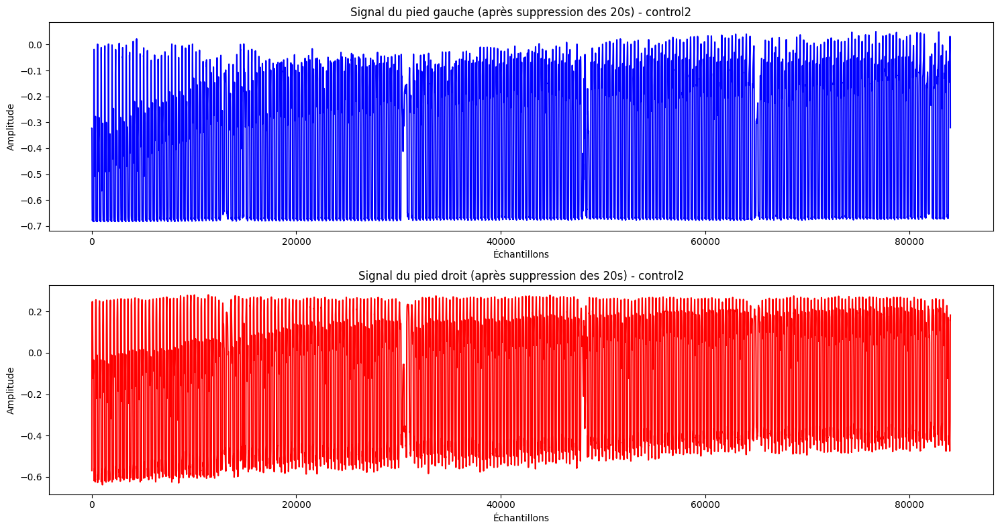


Informations après suppression des 20 secondes:
Fréquence d'échantillonnage: 300 Hz
Nombre d'échantillons (gauche): 84000
Nombre d'échantillons (droit): 84000


In [ ]:
# 1. Installation des dépendances
!pip install wfdb numpy matplotlib
import os
import wfdb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob


os.chdir('/content/drive/MyDrive/gaitndd_dataset/data')

# 3. Fonction pour lire les fichiers TS
def load_ts_data(subject):
    ts_file = f"{subject}.ts"
    columns = [
        'elapsed_time', 'left_stride', 'right_stride',
        'left_swing', 'right_swing', 'left_swing_pct',
        'right_swing_pct', 'left_stance', 'right_stance',
        'left_stance_pct', 'right_stance_pct',
        'double_support', 'double_support_pct'
    ]
    return pd.read_csv(ts_file, sep=r'\s+', header=None, names=columns)


# 4. Fonction pour lire les signaux bruts
def load_raw_signals(subject):
    try:
        # Lecture du signal gauche
        let_signal = wfdb.rdrecord(subject, channels=[0], pn_dir='gaitndd')
        # Lecture du signal droit
        rit_signal = wfdb.rdrecord(subject, channels=[1], pn_dir='gaitndd')

        return {
            'left': let_signal.p_signal.flatten(),
            'right': rit_signal.p_signal.flatten(),
            'fs': let_signal.fs  # Fréquence d'échantillonnage
        }
    except Exception as e:
        print(f"Erreur avec {subject}: {str(e)}")
        return None

# 5. Exemple avec un sujet
subject = 'control2'  # Vous pouvez changer pour als1, hunt1, control1, etc.

# Chargement des données TS
ts_data = load_ts_data(subject)
print(f"\nDonnées TS pour {subject}:")
print(ts_data.head())

# Chargement des signaux bruts
raw_signals = load_raw_signals(subject)

if raw_signals:
    # Remove the first 20 seconds
    fs = raw_signals['fs']
    samples_to_remove = int(20 * fs)
    raw_signals['left'] = raw_signals['left'][samples_to_remove:]
    raw_signals['right'] = raw_signals['right'][samples_to_remove:]

    # Continue with visualization
    plt.figure(figsize=(15, 8))

    plt.subplot(2, 1, 1)
    plt.plot(raw_signals['left'], 'b')
    plt.title(f'Signal du pied gauche (après suppression des 20s) - {subject}')
    plt.xlabel('Échantillons')
    plt.ylabel('Amplitude')

    plt.subplot(2, 1, 2)
    plt.plot(raw_signals['right'], 'r')
    plt.title(f'Signal du pied droit (après suppression des 20s) - {subject}')
    plt.xlabel('Échantillons')
    plt.ylabel('Amplitude')

    plt.tight_layout()
    plt.show()

    print(f"\nInformations après suppression des 20 secondes:")
    print(f"Fréquence d'échantillonnage: {fs} Hz")
    print(f"Nombre d'échantillons (gauche): {len(raw_signals['left'])}")
    print(f"Nombre d'échantillons (droit): {len(raw_signals['right'])}")


# ***pipeline complet de prétraitement de signaux de marche***


Traitement de control2 (fs=300 Hz)
Durée après suppression 20s: 280.0s
Point de synchronisation: 0.00s
Durée utilisable: 280.0s

Résumé final:
Durée traitée: 280.0s
Points de données: 84000


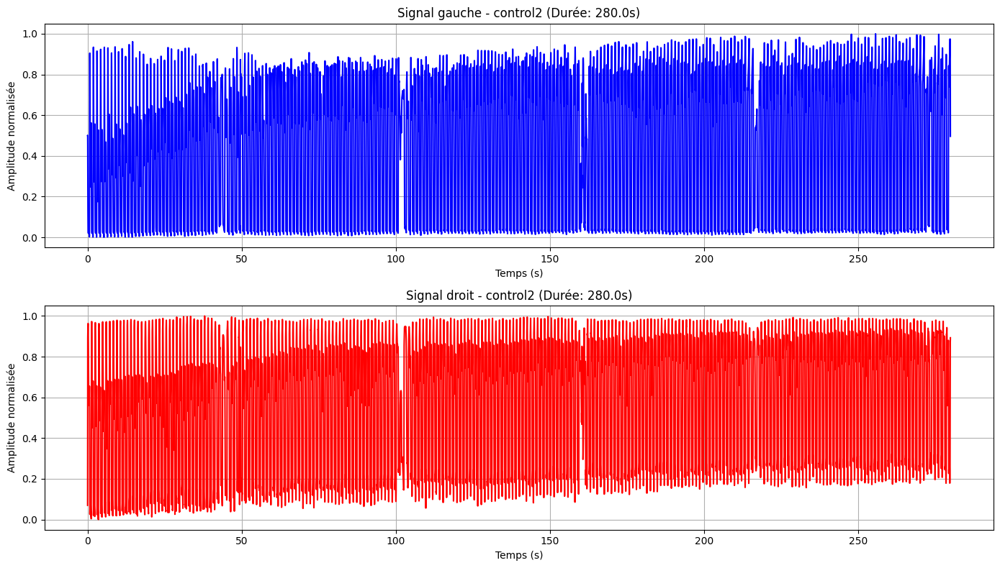

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import interpolate as sp_interpolate
from scipy.signal import butter, filtfilt

def min_max_normalize(signal):
    min_val = np.min(signal)
    max_val = np.max(signal)
    range_val = max_val - min_val
    # Évite la division par 0 en cas où tous les éléments sont identiques
    if range_val == 0:
        return np.zeros_like(signal)
    return (signal - min_val) / range_val



def interpolate_nans(signal):
    """Interpolation plus robuste des valeurs NaN"""
    nans = np.isnan(signal)
    if np.any(nans):
        not_nans = ~nans
        indices = np.arange(len(signal))
        signal[nans] = np.interp(indices[nans], indices[not_nans], signal[not_nans])
    return signal

def butter_lowpass_filter(signal, fs, cutoff=15, order=2):
    """Filtrage passe-bas avec protection contre les signaux vides"""
    if len(signal) == 0 or np.all(np.isnan(signal)):
        return np.zeros_like(signal)

    signal = interpolate_nans(signal)
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return filtfilt(b, a, signal)

def find_first_contact(sig, fs, threshold=0.1, max_search_seconds=5):
    """Détection du premier contact avec limite de temps"""
    max_search_samples = int(max_search_seconds * fs)
    search_window = sig[:min(max_search_samples, len(sig))]

    if len(search_window) == 0:
        return 0

    # Normalisation robuste
    search_window = (search_window - np.median(search_window)) / (np.percentile(search_window, 95) - np.percentile(search_window, 5) + 1e-6)

    above_thresh = np.where(search_window > threshold)[0]
    return above_thresh[0] if len(above_thresh) > 0 else 0

def preprocess_pipeline(subject, max_duration=300):
    """Pipeline complet avec gestion améliorée de la durée"""
    # 1. Chargement des données
    raw_signals = load_raw_signals(subject)
    if raw_signals is None:
        return None

    fs = raw_signals['fs']
    print(f"\nTraitement de {subject} (fs={fs} Hz)")

    # 2. Suppression des 20 premières secondes
    samples_20s = int(20 * fs)
    raw_left = interpolate_nans(raw_signals['left'][samples_20s:])
    raw_right = interpolate_nans(raw_signals['right'][samples_20s:])

    print(f"Durée après suppression 20s: {len(raw_left)/fs:.1f}s")

    # 3. Synchronisation limitée à 5s
    left_start = find_first_contact(raw_left, fs, max_search_seconds=5)
    right_start = find_first_contact(raw_right, fs, max_search_seconds=5)
    sync_point = min(left_start, right_start)

    print(f"Point de synchronisation: {sync_point/fs:.2f}s")

    # 4. Découpage du signal
    max_samples = int((max_duration - 20) * fs)  # Compensation des 20s supprimées
    usable_samples = min(len(raw_left) - sync_point, max_samples)
    duration = usable_samples / fs

    print(f"Durée utilisable: {duration:.1f}s")

    # 5. Extraction des signaux
    raw_left = raw_left[sync_point:sync_point+usable_samples]
    raw_right = raw_right[sync_point:sync_point+usable_samples]

    # 6. Filtrage
    synced_left = butter_lowpass_filter(raw_left, fs=fs)
    synced_right = butter_lowpass_filter(raw_right, fs=fs)

    # 7. Normalisation
    # Z-score normalization



    # 7. Normalisation
    # Min-Max normalization (mise à l'échelle entre 0 et 1)
    left_normalized = min_max_normalize(synced_left)
    right_normalized = min_max_normalize(synced_right)



    # 8. Création du DataFrame
    time_axis = np.linspace(0, duration, len(left_normalized))
    processed_data = pd.DataFrame({
        'timestamp': time_axis,
        'left_signal': left_normalized,
        'right_signal': right_normalized
    })

    print("\nRésumé final:")
    print(f"Durée traitée: {processed_data['timestamp'].iloc[-1]:.1f}s")
    print(f"Points de données: {len(processed_data)}")

    return processed_data

# Test avec visualisation
subject = 'control2'
processed_data = preprocess_pipeline(subject)

if processed_data is not None:
    plt.figure(figsize=(14, 8))

    # Signal gauche
    plt.subplot(2, 1, 1)
    plt.plot(processed_data['timestamp'], processed_data['left_signal'], 'b')
    plt.title(f'Signal gauche - {subject} (Durée: {processed_data["timestamp"].iloc[-1]:.1f}s)')
    plt.xlabel('Temps (s)')
    plt.ylabel('Amplitude normalisée')
    plt.grid(True)

    # Signal droit
    plt.subplot(2, 1, 2)
    plt.plot(processed_data['timestamp'], processed_data['right_signal'], 'r')
    plt.title(f'Signal droit - {subject} (Durée: {processed_data["timestamp"].iloc[-1]:.1f}s)')
    plt.xlabel('Temps (s)')
    plt.ylabel('Amplitude normalisée')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

In [ ]:
print(df.columns)


Index(['timestamp', 'left_signal'], dtype='object')


# ***prétraitement et la sauvegarde des signaux de marche***

In [ ]:
import os
from glob import glob

# 1. Chemins source et destination
source_dir = '/content/drive/MyDrive/gaitndd_dataset/data'
output_dir = '/content/drive/MyDrive/gaitndd_dataset/processed_data'
os.makedirs(output_dir, exist_ok=True)

# 2. Liste des sujets à partir des fichiers .ts
all_subjects = [os.path.splitext(os.path.basename(f))[0] for f in glob(os.path.join(source_dir, '*.ts'))]

successful = []

# 3. Traitement
for subj in all_subjects:
    try:
        data = preprocess_pipeline(os.path.join(source_dir, subj))
        if data is not None:
            # 3.1. Fichier complet
            full_path = os.path.join(output_dir, f'processed_{subj}_full.csv')
            data.to_csv(full_path, index=False)

            # 3.2. Colonnes gauche et droite avec timestamp si présent
            timestamp_col = 'timestamp' if 'timestamp' in data.columns else 'elapsed_time'
            left_cols = [timestamp_col] + [col for col in data.columns if 'left' in col]
            right_cols = [timestamp_col] + [col for col in data.columns if 'right' in col]

            # 3.3. Fichiers séparés gauche/droite
            left_path = os.path.join(output_dir, f'processed_{subj}_left.csv')
            right_path = os.path.join(output_dir, f'processed_{subj}_right.csv')

            data[left_cols].to_csv(left_path, index=False)
            data[right_cols].to_csv(right_path, index=False)

            successful.append(subj)

    except Exception as e:
        print(f"Erreur avec {subj}: {str(e)}")

# 4. Rapport
print(f"\nTraitement terminé. Succès: {len(successful)}/{len(all_subjects)}")
print(f"Emplacement des résultats: {output_dir}")

# 5. Vérification
print("\n5 premiers fichiers créés:")
for f in sorted(os.listdir(output_dir))[:5]:
    print(f"- {f}")



Traitement de /content/drive/MyDrive/gaitndd_dataset/data/als1 (fs=300 Hz)
Durée après suppression 20s: 280.0s
Point de synchronisation: 0.00s
Durée utilisable: 280.0s

Résumé final:
Durée traitée: 280.0s
Points de données: 84000

Traitement de /content/drive/MyDrive/gaitndd_dataset/data/als2 (fs=300 Hz)
Durée après suppression 20s: 280.0s
Point de synchronisation: 0.25s
Durée utilisable: 279.8s

Résumé final:
Durée traitée: 279.8s
Points de données: 83925

Traitement de /content/drive/MyDrive/gaitndd_dataset/data/als3 (fs=300 Hz)
Durée après suppression 20s: 280.0s
Point de synchronisation: 0.00s
Durée utilisable: 280.0s

Résumé final:
Durée traitée: 280.0s
Points de données: 84000

Traitement de /content/drive/MyDrive/gaitndd_dataset/data/als4 (fs=300 Hz)
Durée après suppression 20s: 280.0s
Point de synchronisation: 0.15s
Durée utilisable: 279.8s

Résumé final:
Durée traitée: 279.8s
Points de données: 83954

Traitement de /content/drive/MyDrive/gaitndd_dataset/data/als5 (fs=300 Hz)


# ***Génération automatique de graphiques des signaux de marche gauches et droits à partir de fichiers CSV prétraités***

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob

# Répertoire d'entrée et de sortie
output_dir = '/content/drive/MyDrive/gaitndd_dataset/processed_data'
plots_dir = os.path.join(output_dir, 'plots')
os.makedirs(plots_dir, exist_ok=True)

# Chargement des fichiers CSV traités
processed_files = sorted(glob(os.path.join(output_dir, 'processed_*_full.csv')))

for file_path in processed_files[:64]:  # Limité à 64 fichiers
    try:
        df = pd.read_csv(file_path)
        subject = os.path.basename(file_path).split('_')[1]

        # Plot combiné
        plt.figure(figsize=(10, 4))
        plt.plot(df['timestamp'], df['left_signal'], label='Gauche')
        plt.plot(df['timestamp'], df['right_signal'], label='Droit')
        plt.title(f'Signaux Gauche/Droit - {subject}')
        plt.xlabel('Temps (s)')
        plt.ylabel('Amplitude')
        plt.legend()
        plt.grid(alpha=0.3)
        plt.savefig(os.path.join(plots_dir, f'signals_{subject}.png'), dpi=100, bbox_inches='tight')
        plt.close()

        # Plot gauche uniquement
        plt.figure(figsize=(10, 4))
        plt.plot(df['timestamp'], df['left_signal'], color='blue')
        plt.title(f'Signal Gauche - {subject}')
        plt.xlabel('Temps (s)')
        plt.ylabel('Amplitude')
        plt.grid(alpha=0.3)
        plt.savefig(os.path.join(plots_dir, f'signals_{subject}_left.png'), dpi=100, bbox_inches='tight')
        plt.close()

        # Plot droit uniquement
        plt.figure(figsize=(10, 4))
        plt.plot(df['timestamp'], df['right_signal'], color='orange')
        plt.title(f'Signal Droit - {subject}')
        plt.xlabel('Temps (s)')
        plt.ylabel('Amplitude')
        plt.grid(alpha=0.3)
        plt.savefig(os.path.join(plots_dir, f'signals_{subject}_right.png'), dpi=100, bbox_inches='tight')
        plt.close()

    except Exception as e:
        print(f"Erreur avec {file_path}: {str(e)}")

print(f"Graphiques sauvegardés dans : {plots_dir}")


Graphiques sauvegardés dans : /content/drive/MyDrive/gaitndd_dataset/processed_data/plots


# ***Automatisation de la visualisation des signaux de marche à partir de fichiers CSV prétraités***

In [ ]:
from ipywidgets import interact, Dropdown
import matplotlib.pyplot as plt
import pandas as pd
import os
from glob import glob

# Répertoire contenant les fichiers
output_dir = '/content/drive/MyDrive/gaitndd_dataset/processed_data'
processed_files = sorted(glob(os.path.join(output_dir, 'processed_*_full.csv')))

# Extraire les noms des sujets
subject_names = [os.path.basename(f).replace('processed_', '').replace('_full.csv', '') for f in processed_files]

@interact(subject=Dropdown(options=subject_names, description='Sujet:'))
def plot_interactive(subject):
    file_path = os.path.join(output_dir, f'processed_{subject}_full.csv')
    df = pd.read_csv(file_path)

    # Créer une figure avec 3 sous-graphes (3 colonnes, 1 ligne)
    fig, axes = plt.subplots(3, 1, figsize=(12, 12))

    # Courbe gauche
    axes[0].plot(df['timestamp'], df['left_signal'], color='blue')
    axes[0].set_title(f'Signal Gauche - {subject}')
    axes[0].set_xlabel('Temps (s)')
    axes[0].set_ylabel('Amplitude')
    axes[0].grid(alpha=0.3)

    # Courbe droite
    axes[1].plot(df['timestamp'], df['right_signal'], color='orange')
    axes[1].set_title(f'Signal Droit - {subject}')
    axes[1].set_xlabel('Temps (s)')
    axes[1].set_ylabel('Amplitude')
    axes[1].grid(alpha=0.3)

    # Courbe combinée (gauche + droite)
    axes[2].plot(df['timestamp'], df['left_signal'], label='Gauche', color='blue')
    axes[2].plot(df['timestamp'], df['right_signal'], label='Droit', color='orange')
    axes[2].set_title(f'Signaux Combinés - {subject}')
    axes[2].set_xlabel('Temps (s)')
    axes[2].set_ylabel('Amplitude')
    axes[2].legend()
    axes[2].grid(alpha=0.3)

    # Ajuster l'espace entre les sous-graphes
    plt.tight_layout()

    # Afficher le graphique
    plt.show()


interactive(children=(Dropdown(description='Sujet:', options=('als10', 'als11', 'als12', 'als13', 'als1', 'als…

# ***Inspection des colonnes d’un fichier CSV de signaux de marche***

In [ ]:
# Exemple pour inspecter les colonnes dans un fichier
import pandas as pd

file_path = '/content/drive/MyDrive/gaitndd_dataset/processed_data/processed_als1_full.csv'  # Remplace par ton fichier
data = pd.read_csv(file_path)
print(data.columns)  # Afficher les colonnes du fichier


Index(['timestamp', 'left_signal', 'right_signal'], dtype='object')


# ***Exploration du contenu du dossier de données traitées***

In [ ]:
import os

source_dir = '/content/drive/MyDrive/gaitndd_dataset/processed_data'
print(os.listdir(source_dir))  # Liste les fichiers présents dans le répertoire


['processed_als1_full.csv', 'processed_als1_left.csv', 'processed_als1_right.csv', 'processed_als2_full.csv', 'processed_als2_left.csv', 'processed_als2_right.csv', 'processed_als3_full.csv', 'processed_als3_left.csv', 'processed_als3_right.csv', 'processed_als4_full.csv', 'processed_als4_left.csv', 'processed_als4_right.csv', 'processed_als5_full.csv', 'processed_als5_left.csv', 'processed_als5_right.csv', 'processed_als6_full.csv', 'processed_als6_left.csv', 'processed_als6_right.csv', 'processed_als7_full.csv', 'processed_als7_left.csv', 'processed_als7_right.csv', 'processed_als8_full.csv', 'processed_als8_left.csv', 'processed_als8_right.csv', 'processed_als9_full.csv', 'processed_als9_left.csv', 'processed_als9_right.csv', 'processed_als10_full.csv', 'processed_als10_left.csv', 'processed_als10_right.csv', 'processed_als11_full.csv', 'processed_als11_left.csv', 'processed_als11_right.csv', 'processed_als12_full.csv', 'processed_als12_left.csv', 'processed_als12_right.csv', 'proce

# ***Fenêtrage temporel des signaux de marche gauches et droits avec sauvegarde au format NumPy***

In [ ]:
import os
import numpy as np
import pandas as pd
from glob import glob

# Fonction de fenêtrage
def create_windows(signal, window_size, step):
    return np.array([
        signal[i:i + window_size]
        for i in range(0, len(signal) - window_size + 1, step)
    ])

# Paramètres
source_dir = '/content/drive/MyDrive/gaitndd_dataset/processed_data'
output_dir = '/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait'
os.makedirs(output_dir, exist_ok=True)

sampling_rate = 300  # Hz
window_duration_sec = 4
window_size = sampling_rate * window_duration_sec  # 1200 échantillons
step = sampling_rate * 2  # chevauchement de 2s => 2s de pas

# Fenêtrage pour les signaux gauches
for file in glob(os.path.join(source_dir, 'processed_*_left.csv')):
    try:
        df = pd.read_csv(file)
        left_signal = df['left_signal'].values
        left_windows = create_windows(left_signal, window_size, step)

        subject_id = os.path.basename(file).replace('_left.csv', '')
        output_path = os.path.join(output_dir, f'{subject_id}_left_windows.npy')
        np.save(output_path, left_windows)

        print(f'{subject_id} (left) : {left_windows.shape} fenêtres sauvegardées.')
    except Exception as e:
        print(f"Erreur (left) pour {file} : {str(e)}")

# Fenêtrage pour les signaux droits
for file in glob(os.path.join(source_dir, 'processed_*_right.csv')):
    try:
        df = pd.read_csv(file)
        right_signal = df['right_signal'].values
        right_windows = create_windows(right_signal, window_size, step)

        subject_id = os.path.basename(file).replace('_right.csv', '')
        output_path = os.path.join(output_dir, f'{subject_id}_right_windows.npy')
        np.save(output_path, right_windows)

        print(f'{subject_id} (right) : {right_windows.shape} fenêtres sauvegardées.')
    except Exception as e:
        print(f"Erreur (right) pour {file} : {str(e)}")


processed_als1 (left) : (139, 1200) fenêtres sauvegardées.
processed_als2 (left) : (138, 1200) fenêtres sauvegardées.
processed_als3 (left) : (139, 1200) fenêtres sauvegardées.
processed_als4 (left) : (138, 1200) fenêtres sauvegardées.
processed_als5 (left) : (139, 1200) fenêtres sauvegardées.
processed_als6 (left) : (139, 1200) fenêtres sauvegardées.
processed_als8 (left) : (139, 1200) fenêtres sauvegardées.
processed_als7 (left) : (139, 1200) fenêtres sauvegardées.
processed_als9 (left) : (139, 1200) fenêtres sauvegardées.
processed_als10 (left) : (138, 1200) fenêtres sauvegardées.
processed_als12 (left) : (139, 1200) fenêtres sauvegardées.
processed_als11 (left) : (138, 1200) fenêtres sauvegardées.
processed_als13 (left) : (138, 1200) fenêtres sauvegardées.
processed_control1 (left) : (139, 1200) fenêtres sauvegardées.
processed_control2 (left) : (139, 1200) fenêtres sauvegardées.
processed_control3 (left) : (138, 1200) fenêtres sauvegardées.
processed_control4 (left) : (138, 1200) 

# ***Visualisation des fenêtres de signal du pied droit pour un sujet donné***

Forme des données (pied droit) pour processed_park2: (139, 1200)


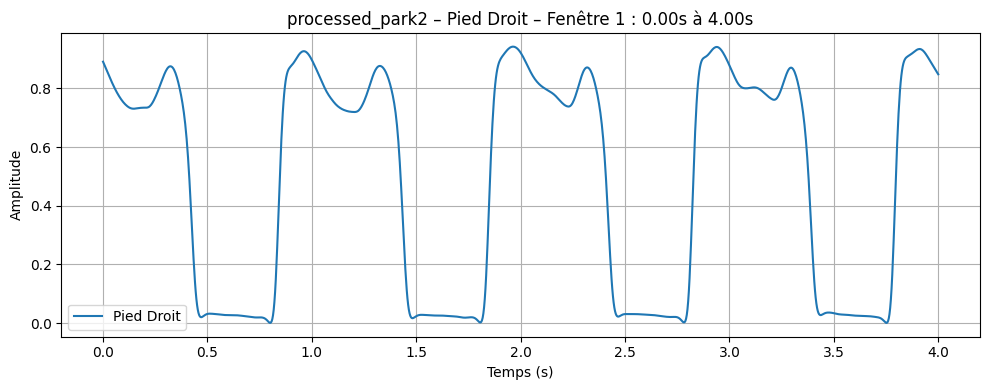

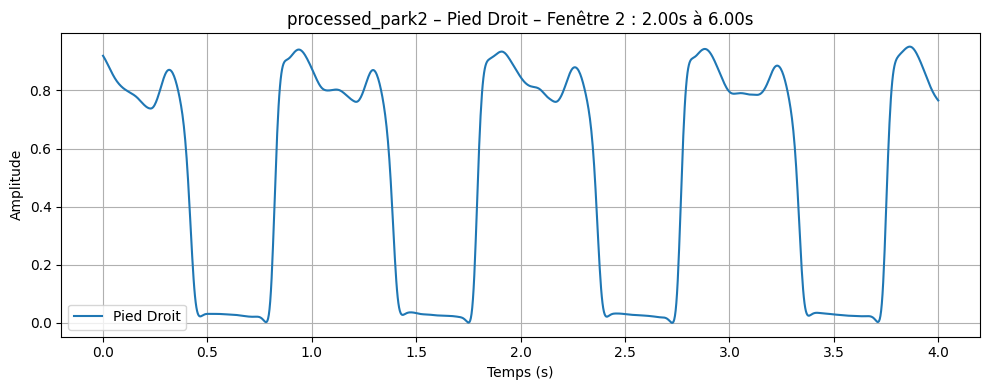

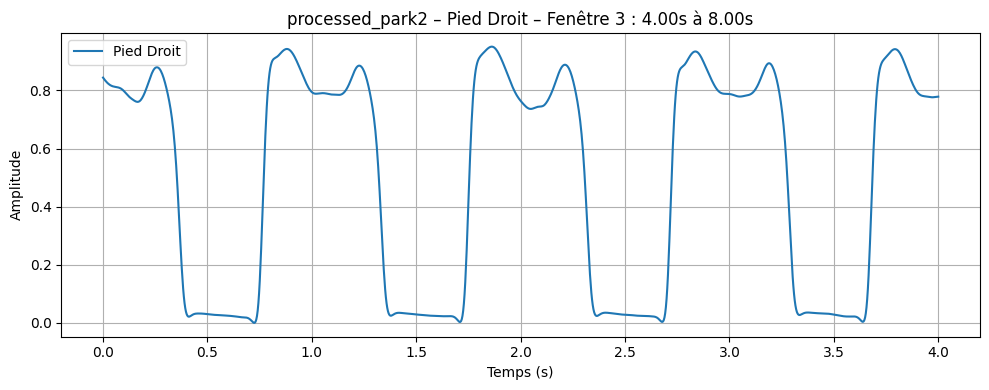

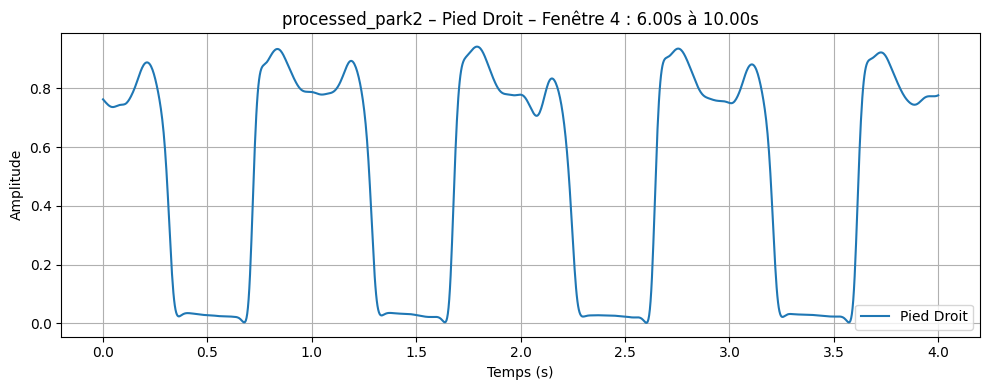

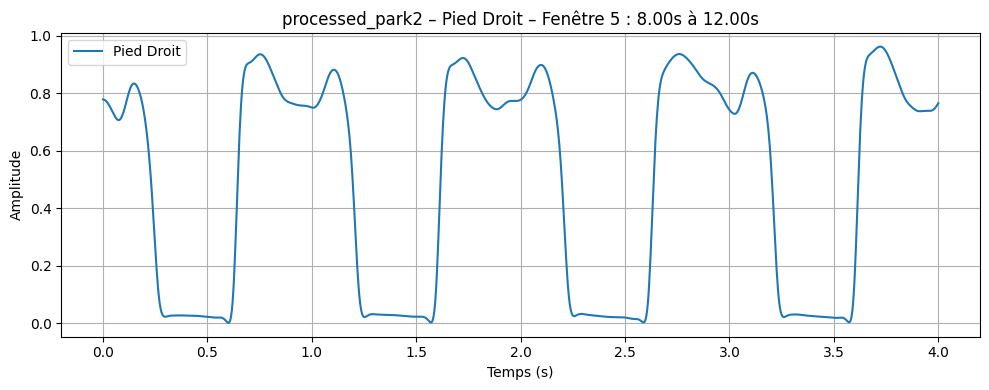

...

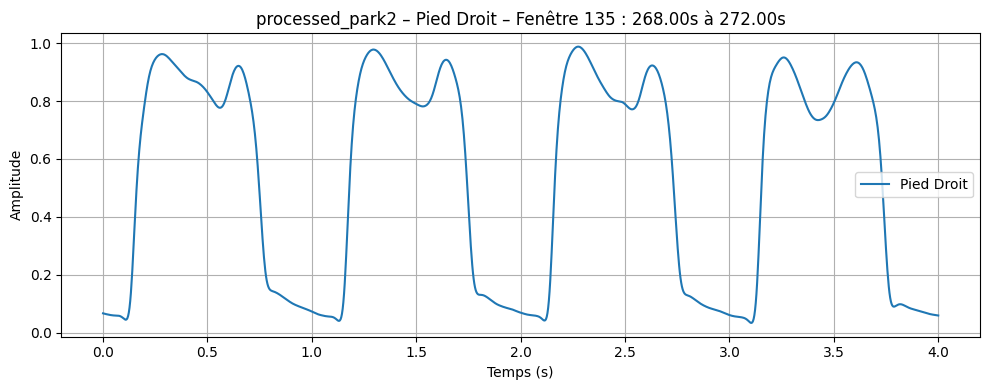

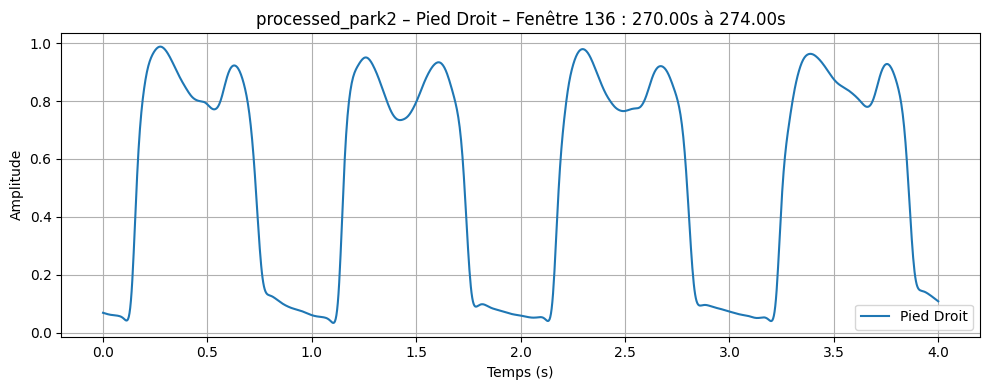

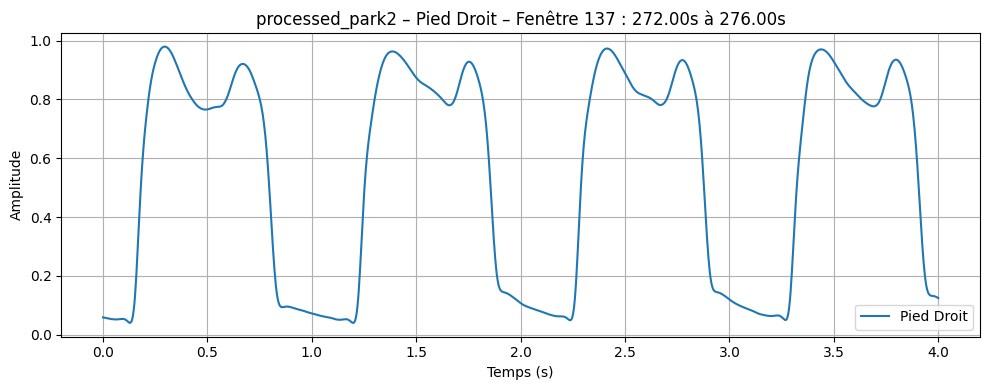

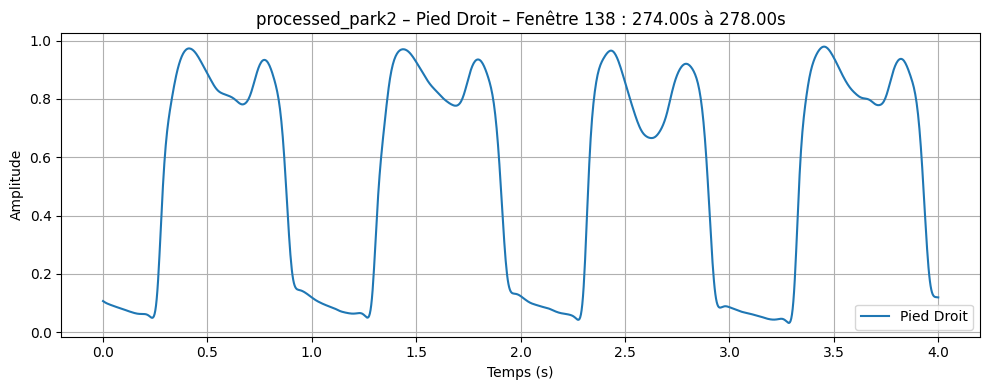

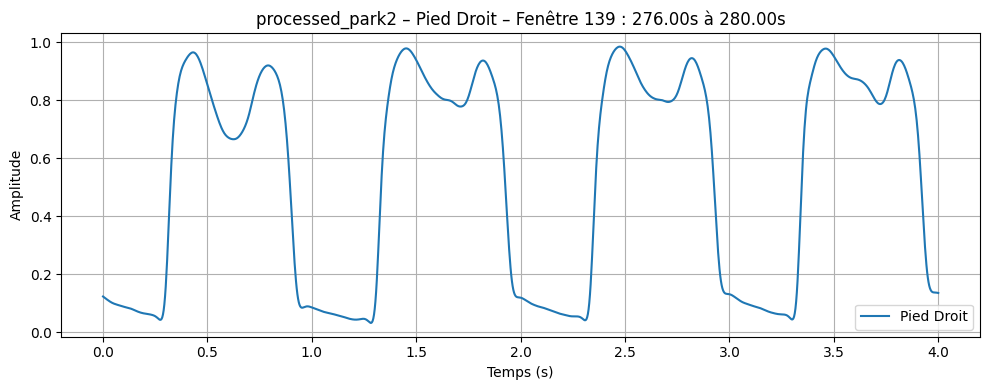

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Nom du sujet à visualiser (sans suffixe)
subject = 'processed_park2'  # Remplace par le nom souhaité

# Chemin vers les fenêtres du pied droit
file_path = f'/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/{subject}_right_windows.npy'

# Charger les fenêtres
windows_data = np.load(file_path)

# Paramètres mis à jour
sampling_rate = 300  # Hz
window_duration = 4  # secondes
window_size = sampling_rate * window_duration  # 1200 échantillons
step = sampling_rate * 2  # 2s de pas = chevauchement de 2s
time_axis = np.linspace(0, window_duration, window_size)

# Affichage des fenêtres du pied droit
print(f'Forme des données (pied droit) pour {subject}: {windows_data.shape}')

for i in range(windows_data.shape[0]):
    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, windows_data[i], label="Pied Droit", color='tab:blue')
    start_time = i * (step / sampling_rate)
    end_time = start_time + window_duration
    plt.title(f'{subject} – Pied Droit – Fenêtre {i+1} : {start_time:.2f}s à {end_time:.2f}s')
    plt.xlabel('Temps (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


# ***Visualisation des fenêtres de signal du pied gauche pour un sujet de marche***

Forme des données (pied gauche) pour processed_park2: (139, 1200)


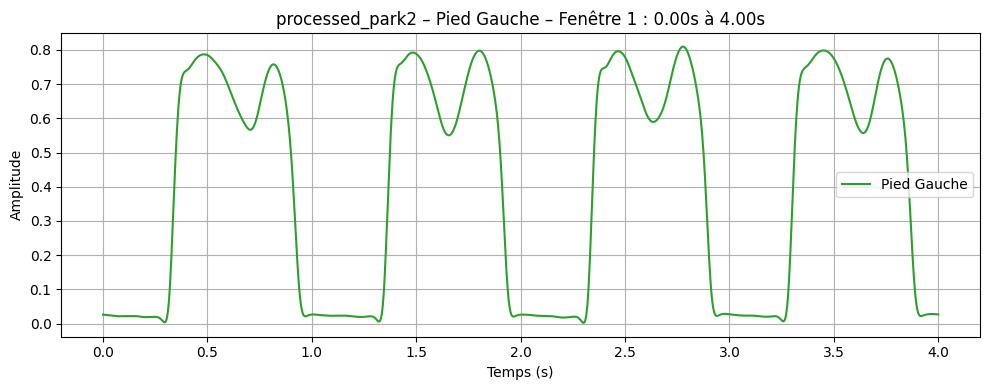

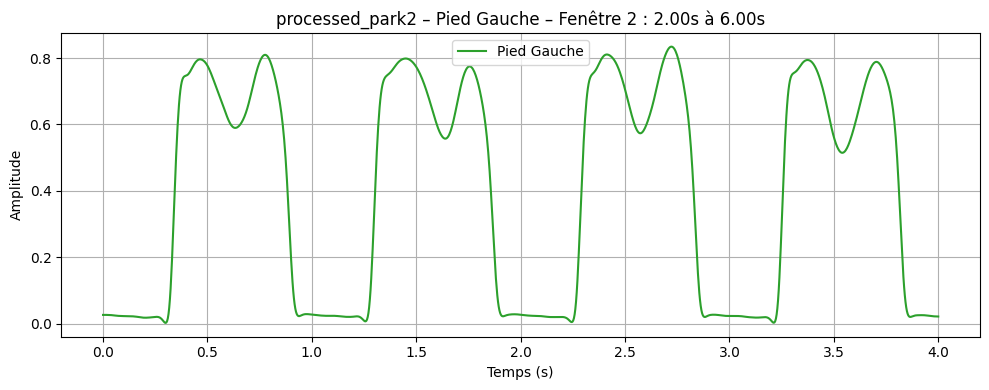

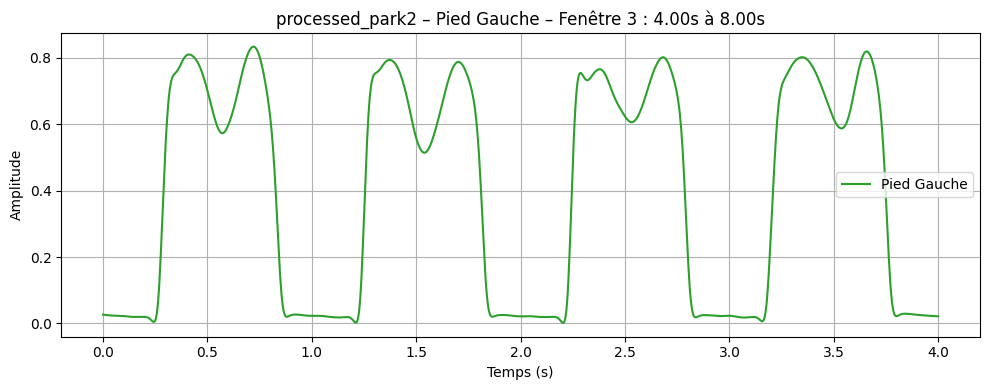

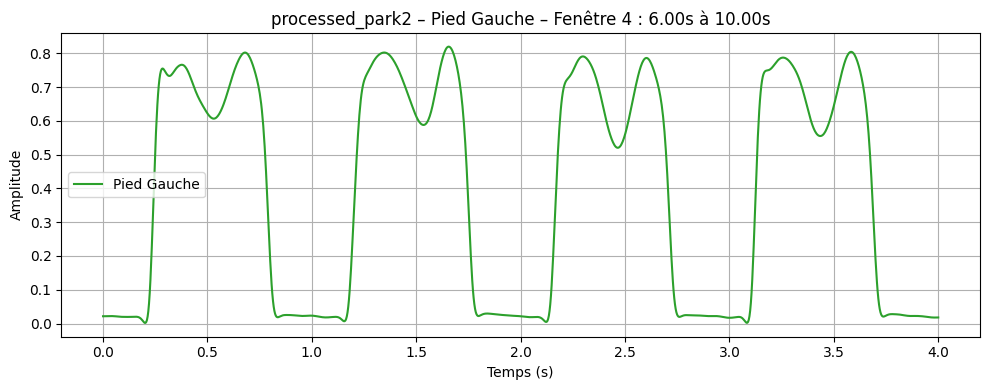

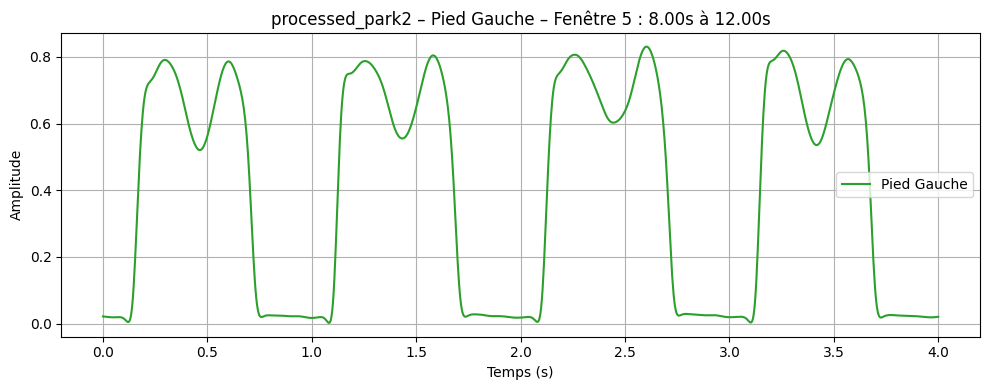

...

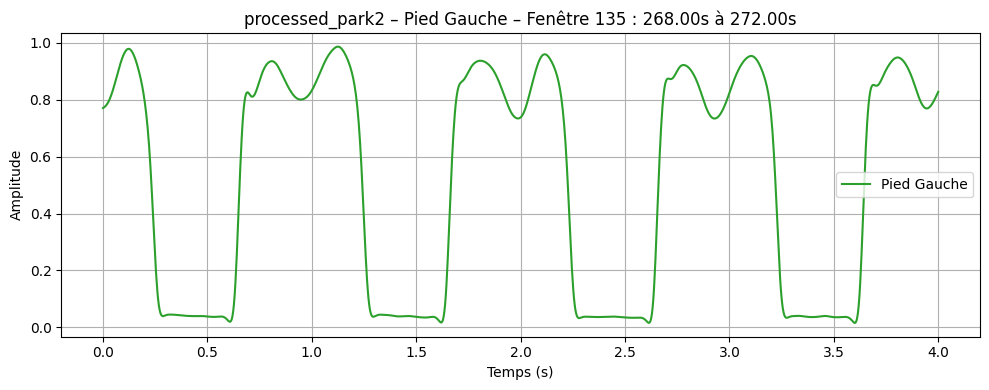

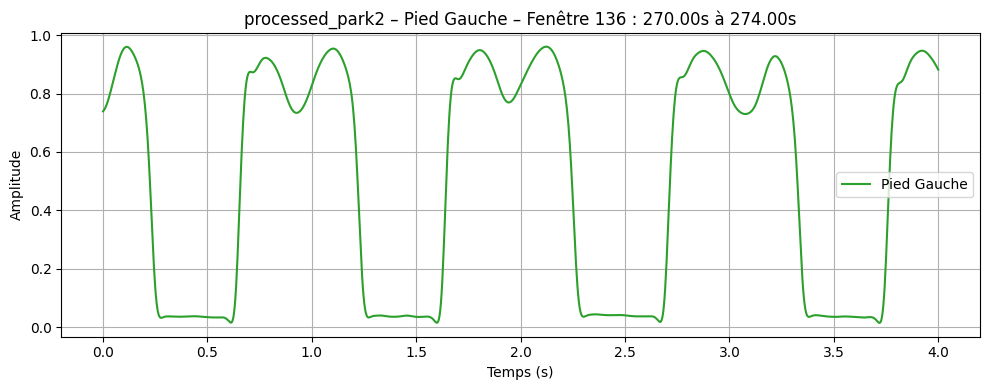

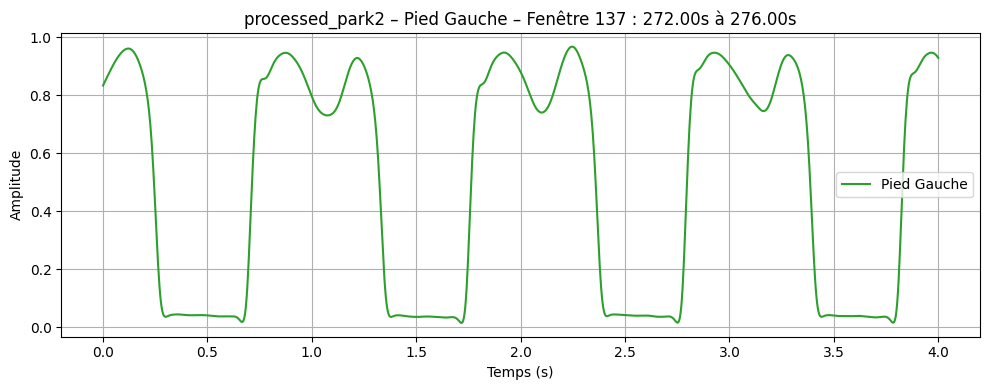

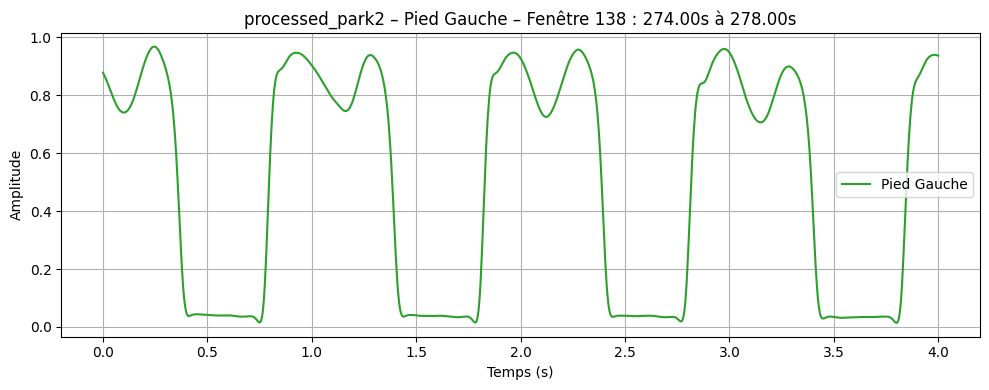

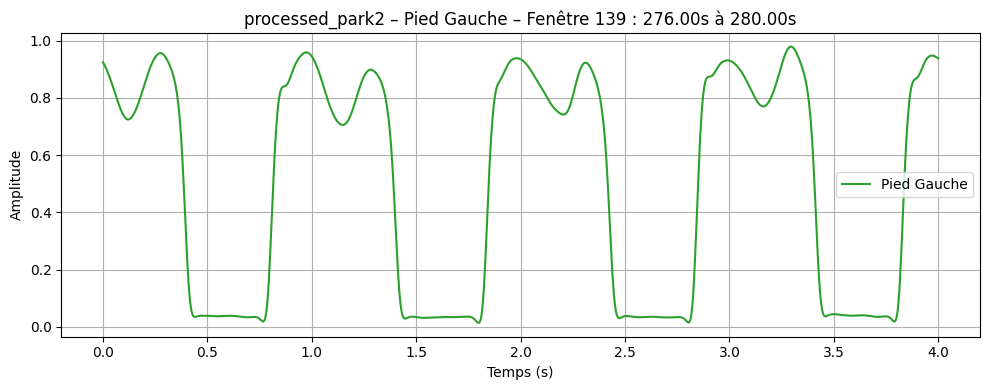

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Nom du sujet à visualiser (sans suffixe)
subject = 'processed_park2'  # Remplace par le nom souhaité

# Chemin vers les fenêtres du pied gauche
file_path = f'/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/{subject}_left_windows.npy'

# Charger les fenêtres
windows_data = np.load(file_path)

# Paramètres mis à jour
sampling_rate = 300  # Hz
window_duration = 4  # secondes
window_size = sampling_rate * window_duration  # 1200 échantillons
step = sampling_rate * 2  # 2s de pas = chevauchement de 2s
time_axis = np.linspace(0, window_duration, window_size)

# Affichage des fenêtres du pied gauche
print(f'Forme des données (pied gauche) pour {subject}: {windows_data.shape}')

for i in range(windows_data.shape[0]):
    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, windows_data[i], label="Pied Gauche", color='tab:green')
    start_time = i * (step / sampling_rate)
    end_time = start_time + window_duration
    plt.title(f'{subject} – Pied Gauche – Fenêtre {i+1} : {start_time:.2f}s à {end_time:.2f}s')
    plt.xlabel('Temps (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


three sigma rule (pied gauche)

# ***Détection et suppression des fenêtres anormales dans les données de marche***

In [ ]:
import os
import numpy as np

# Fonction de filtrage 3-sigma
def compute_valid_mask(windows, lower_bound, upper_bound):
    medians = np.median(windows, axis=1)
    return (medians >= lower_bound) & (medians <= upper_bound)

def remove_outlier_windows(left_windows, right_windows):
    assert len(left_windows) == len(right_windows), "Nombre de fenêtres non aligné"

    # Médianes des fenêtres gauche et droite
    medians_left = np.median(left_windows, axis=1)
    medians_right = np.median(right_windows, axis=1)

    # Médiane et écart-type globaux
    combined_medians = np.concatenate([medians_left, medians_right])
    overall_median = np.median(combined_medians)
    std = np.std(combined_medians)

    # Bornes selon 3-sigma
    lower_bound = overall_median - 3 * std
    upper_bound = overall_median + 3 * std

    # Masques de validité
    mask_left = compute_valid_mask(left_windows, lower_bound, upper_bound)
    mask_right = compute_valid_mask(right_windows, lower_bound, upper_bound)

    # Une paire est valide uniquement si les deux fenêtres sont valides
    valid_mask = mask_left & mask_right

    return left_windows[valid_mask], right_windows[valid_mask]

# Répertoire contenant les fichiers
windows_dir = '/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/'

# Lister les fichiers _left_windows.npy
left_files = [f for f in os.listdir(windows_dir) if f.endswith('_left_windows.npy')]

# Traitement principal
for file_name in left_files:
    try:
        subject = file_name.replace('_left_windows.npy', '')
        left_path = os.path.join(windows_dir, file_name)
        right_path = os.path.join(windows_dir, f'{subject}_right_windows.npy')

        if os.path.exists(right_path):
            windows_left = np.load(left_path)
            windows_right = np.load(right_path)
            print(f"\nTraitement de {subject} – forme initiale : gauche {windows_left.shape}, droit {windows_right.shape}")

            filtered_left, filtered_right = remove_outlier_windows(windows_left, windows_right)
            print(f"Forme après filtrage : gauche {filtered_left.shape}, droit {filtered_right.shape}")

            # Sauvegarde
            np.save(os.path.join(windows_dir, f'{subject}_left_windows_filtered.npy'), filtered_left)
            np.save(os.path.join(windows_dir, f'{subject}_right_windows_filtered.npy'), filtered_right)
            print(f"Sauvegardé : {subject}_left/right_windows_filtered.npy")

        else:
            print(f"Fichier droit manquant pour {subject}")

    except Exception as e:
        print(f"Erreur lors du traitement de {file_name} : {e}")



Traitement de processed_als1 – forme initiale : gauche (139, 1200), droit (139, 1200)
Forme après filtrage : gauche (127, 1200), droit (127, 1200)
Sauvegardé : processed_als1_left/right_windows_filtered.npy

Traitement de processed_als6 – forme initiale : gauche (139, 1200), droit (139, 1200)
Forme après filtrage : gauche (137, 1200), droit (137, 1200)
Sauvegardé : processed_als6_left/right_windows_filtered.npy

Traitement de processed_als5 – forme initiale : gauche (139, 1200), droit (139, 1200)
Forme après filtrage : gauche (139, 1200), droit (139, 1200)
Sauvegardé : processed_als5_left/right_windows_filtered.npy

Traitement de processed_als2 – forme initiale : gauche (138, 1200), droit (138, 1200)
Forme après filtrage : gauche (136, 1200), droit (136, 1200)
Sauvegardé : processed_als2_left/right_windows_filtered.npy

Traitement de processed_als9 – forme initiale : gauche (139, 1200), droit (139, 1200)
Forme après filtrage : gauche (133, 1200), droit (133, 1200)
Sauvegardé : process

3sr(droite)


# ***Préparation des données fenêtrées des deux pieds (gauche et droite) des sujets contrôles pour entraînement du modèle de base***

In [ ]:
import numpy as np
import glob
from sklearn.model_selection import train_test_split

# === Étape 1 : Charger les fichiers filtrés des sujets contrôles ===
left_files = sorted(glob.glob("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/processed_control*_left_windows_filtered.npy"))
right_files = sorted(glob.glob("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/processed_control*_right_windows_filtered.npy"))

all_windows = []
labels_foot = []    # 0 = gauche, 1 = droite
labels_person = []  # ID unique de la personne

# === Étape 2 : Charger les données et créer les labels ===
for person_id, (left_file, right_file) in enumerate(zip(left_files, right_files)):
    left_data = np.load(left_file)
    right_data = np.load(right_file)

    all_windows.append(left_data)
    all_windows.append(right_data)

    labels_foot.extend([0] * len(left_data) + [1] * len(right_data))  # 0=gauche, 1=droit
    labels_person.extend([person_id] * (len(left_data) + len(right_data)))  # ID sujet

# Fusionner les fenêtres en un seul tableau
X = np.concatenate(all_windows, axis=0)            # Shape (N_total, 1800)
X = X.reshape(X.shape[0], 1200, 1)                  # Shape (N_total, 1200, 1)
y_foot = np.array(labels_foot)
y_person = np.array(labels_person)
y_combined = y_foot + 2 * y_person                  # Ex: 0=gauche_0, 1=droit_0, 2=gauche_1, ...

# === Étape 3 : Séparation en train/test ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y_combined, test_size=0.2, random_state=42
)

# === Étape 4 : Sauvegarde ===
np.savez("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/controls_train_data.npz", data=X_train, labels=y_train)
np.savez("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/controls_test_data.npz", data=X_test, labels=y_test)


# ***vérification des données d'entraînement et test pour modèle pied gauche/droit***

In [ ]:
import numpy as np

# Chargement des données
train_data = np.load("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/controls_train_data.npz")
X_train = train_data['data']
y_train = train_data['labels']

test_data = np.load("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/controls_test_data.npz")
X_test = test_data['data']
y_test = test_data['labels']

# Vérification des formes des données
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)


X_train shape: (3491, 1200, 1)
y_train shape: (3491,)
X_test shape: (873, 1200, 1)
y_test shape: (873,)


# ***Entraînement d’un modèle WGAN-GP 1D de base sur les données de marche (deux pieds) des sujets contrôles***

# ***Extraction indépendante et sauvegarde des signaux de marche filtrés (pied gauche seul / pied droit seul) des sujets contrôles ***

In [ ]:
import numpy as np
import glob
from sklearn.model_selection import train_test_split
import os

# === Créer le dossier cible s'il n'existe pas ===
output_dir = "/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/Splited_Data"
os.makedirs(output_dir, exist_ok=True)

# === Étape 1 : Charger les fichiers filtrés des sujets contrôles ===
left_files = sorted(glob.glob("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/processed_control*_left_windows_filtered.npy"))
right_files = sorted(glob.glob("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/processed_control*_right_windows_filtered.npy"))

# === Étape 2 : Charger les données et créer les labels ===
X_left, X_right = [], []
y_left, y_right = [], []

for person_id, (left_file, right_file) in enumerate(zip(left_files, right_files)):
    left_data = np.load(left_file)
    right_data = np.load(right_file)

    X_left.append(left_data)
    X_right.append(right_data)

    y_left.extend([person_id] * len(left_data))
    y_right.extend([person_id] * len(right_data))

# === Étape 3 : Fusionner et reshaper ===
X_left = np.concatenate(X_left, axis=0).reshape(-1, 1200, 1)
X_right = np.concatenate(X_right, axis=0).reshape(-1, 1200, 1)
y_left = np.array(y_left)
y_right = np.array(y_right)



# === Étape 5 : Sauvegarde dans le dossier Splited_Data ===

np.savez(os.path.join(output_dir, "controls_all_left.npz"), data=X_left, labels=y_left)
np.savez(os.path.join(output_dir, "controls_all_right.npz"), data=X_right, labels=y_right)


# Extraction indépendante et sauvegarde des signaux de marche filtrés (pied gauche seul / pied droit seul) des sujets als ***texte en italique***

In [ ]:
import numpy as np
import glob
from sklearn.model_selection import train_test_split
import os

# === Créer le dossier cible s'il n'existe pas ===
output_dir = "/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/Splited_Data"
os.makedirs(output_dir, exist_ok=True)

# === Étape 1 : Charger les fichiers filtrés des sujets ALS ===
left_files = sorted(glob.glob("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/processed_als*_left_windows_filtered.npy"))
right_files = sorted(glob.glob("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/processed_als*_right_windows_filtered.npy"))

# === Étape 2 : Charger les données et créer les labels ===
X_left, X_right = [], []
y_left, y_right = [], []

for person_id, (left_file, right_file) in enumerate(zip(left_files, right_files)):
    left_data = np.load(left_file)
    right_data = np.load(right_file)

    X_left.append(left_data)
    X_right.append(right_data)

    y_left.extend([person_id] * len(left_data))
    y_right.extend([person_id] * len(right_data))

# === Étape 3 : Fusionner et reshaper ===
X_left = np.concatenate(X_left, axis=0).reshape(-1, 1200, 1)
X_right = np.concatenate(X_right, axis=0).reshape(-1, 1200, 1)
y_left = np.array(y_left)
y_right = np.array(y_right)


# === Étape 5 : Sauvegarde dans le dossier Splited_Data ===

np.savez(os.path.join(output_dir, "als_all_left.npz"), data=X_left, labels=y_left)
np.savez(os.path.join(output_dir, "als_all_right.npz"), data=X_right, labels=y_right)


# ***Extraction indépendante et sauvegarde des signaux de marche filtrés (pied gauche seul / pied droit seul) des sujets park ***

In [ ]:
import numpy as np
import glob
from sklearn.model_selection import train_test_split
import os

# === Créer le dossier cible s'il n'existe pas ===
output_dir = "/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/Splited_Data"
os.makedirs(output_dir, exist_ok=True)

# === Étape 1 : Charger les fichiers filtrés des sujets Parkinson ===
left_files = sorted(glob.glob("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/processed_park*_left_windows_filtered.npy"))
right_files = sorted(glob.glob("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/processed_park*_right_windows_filtered.npy"))

# === Étape 2 : Charger les données et créer les labels ===
X_left, X_right = [], []
y_left, y_right = [], []

for person_id, (left_file, right_file) in enumerate(zip(left_files, right_files)):
    left_data = np.load(left_file)
    right_data = np.load(right_file)

    X_left.append(left_data)
    X_right.append(right_data)

    y_left.extend([person_id] * len(left_data))
    y_right.extend([person_id] * len(right_data))

# === Étape 3 : Fusionner et reshaper ===
X_left = np.concatenate(X_left, axis=0).reshape(-1, 1200, 1)
X_right = np.concatenate(X_right, axis=0).reshape(-1, 1200, 1)
y_left = np.array(y_left)
y_right = np.array(y_right)



# === Étape 5 : Sauvegarde dans le dossier Splited_Data ===

np.savez(os.path.join(output_dir, "park_all_left.npz"), data=X_left, labels=y_left)
np.savez(os.path.join(output_dir, "park_all_right.npz"), data=X_right, labels=y_right)


# ***Extraction indépendante et sauvegarde des signaux de marche filtrés (pied gauche seul / pied droit seul) des sujets hunt ***

In [ ]:
import numpy as np
import glob
from sklearn.model_selection import train_test_split
import os

# === Créer le dossier cible s'il n'existe pas ===
output_dir = "/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/Splited_Data"
os.makedirs(output_dir, exist_ok=True)

# === Étape 1 : Charger les fichiers filtrés des sujets Huntington ===
left_files = sorted(glob.glob("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/processed_hunt*_left_windows_filtered.npy"))
right_files = sorted(glob.glob("/content/drive/MyDrive/gaitndd_dataset/processed_data/windows_gait/processed_hunt*_right_windows_filtered.npy"))

# === Étape 2 : Charger les données et créer les labels ===
X_left, X_right = [], []
y_left, y_right = [], []

for person_id, (left_file, right_file) in enumerate(zip(left_files, right_files)):
    left_data = np.load(left_file)
    right_data = np.load(right_file)

    X_left.append(left_data)
    X_right.append(right_data)

    y_left.extend([person_id] * len(left_data))
    y_right.extend([person_id] * len(right_data))

# === Étape 3 : Fusionner et reshaper ===
X_left = np.concatenate(X_left, axis=0).reshape(-1, 1200, 1)
X_right = np.concatenate(X_right, axis=0).reshape(-1, 1200, 1)
y_left = np.array(y_left)
y_right = np.array(y_right)

# === Étape 4 : Séparation train/test pour chaque pied ===


# === Étape 5 : Sauvegarde dans le dossier Splited_Data ===

# === Étape finale : Sauvegarde directe sans split ===
np.savez(os.path.join(output_dir, "hunt_all_left.npz"), data=X_left, labels=y_left)
np.savez(os.path.join(output_dir, "hunt_all_right.npz"), data=X_right, labels=y_right)
